<a href="https://colab.research.google.com/github/Slugten/Final-project-CO2-emissions/blob/main/WINC_final_assignment_CO2_emissions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **What is the biggest predictor of a large CO2 output per capita of a country?**

,Entity,Code,Year,Annual CO₂ emissions,Primary energy consumption per GDP (kWh/$),GDP per capita,900793-annotations,Population (historical estimates),Annual CO₂ emissions per unit energy (kg per kilowatt-hour),Annual CO₂ emissions per GDP (kg per international-$)
0,Afghanistan,AFG,1965,1006917.0,NaN,1290.0000,NaN,9565154.0,NaN,0.070973
1,Afghanistan,AFG,1966,1091159.0,NaN,1272.0000,NaN,9783153.0,NaN,0.076170
2,Afghanistan,AFG,1967,1281865.0,NaN,1277.0000,NaN,10010037.0,NaN,0.087000
3,Afghanistan,AFG,1968,1223391.0,NaN,1290.0000,NaN,10247782.0,NaN,0.080200
4,Afghanistan,AFG,1969,941232.0,NaN,1278.0000,NaN,10494491.0,NaN,0.060751
...,...,...,...,...,...,...,...,...,...,...
16287,Zimbabwe,ZWE,2018,10714598.0,1.934178,1900.1992,NaN,15052191.0,0.206808,0.400003
16288,Zimbabwe,ZWE,2019,9775428.0,1.834056,1753.0244,NaN,15354606.0,0.211957,0.388740
16289,Zimbabwe,ZWE,2020,7849639.0,1.811868,1585.9728,NaN,15669663.0,0.186911,0.338657
16290,Zimbabwe,ZWE,2021,8396158.0,1.676422,1687.2532,NaN,15993525.0,0.199219,0.333975


                        Entity Code  Year  Annual CO2 emissions  \
58                      Africa  NaN  1965           213634380.0   
59                      Africa  NaN  1966           221082080.0   
60                      Africa  NaN  1967           237045170.0   
61                      Africa  NaN  1968           257384030.0   
62                      Africa  NaN  1969           277916000.0   
...                        ...  ...   ...                   ...   
15955  Western offshoots (MPD)  NaN  2018                   NaN   
15956  Western offshoots (MPD)  NaN  2019                   NaN   
15957  Western offshoots (MPD)  NaN  2020                   NaN   
15958  Western offshoots (MPD)  NaN  2021                   NaN   
15959  Western offshoots (MPD)  NaN  2022                   NaN   

       Energy intensity  GDP per capita   Population  Carbon intensity  \
58                  NaN             NaN  321447378.0          0.437330   
59                  NaN             NaN  329658

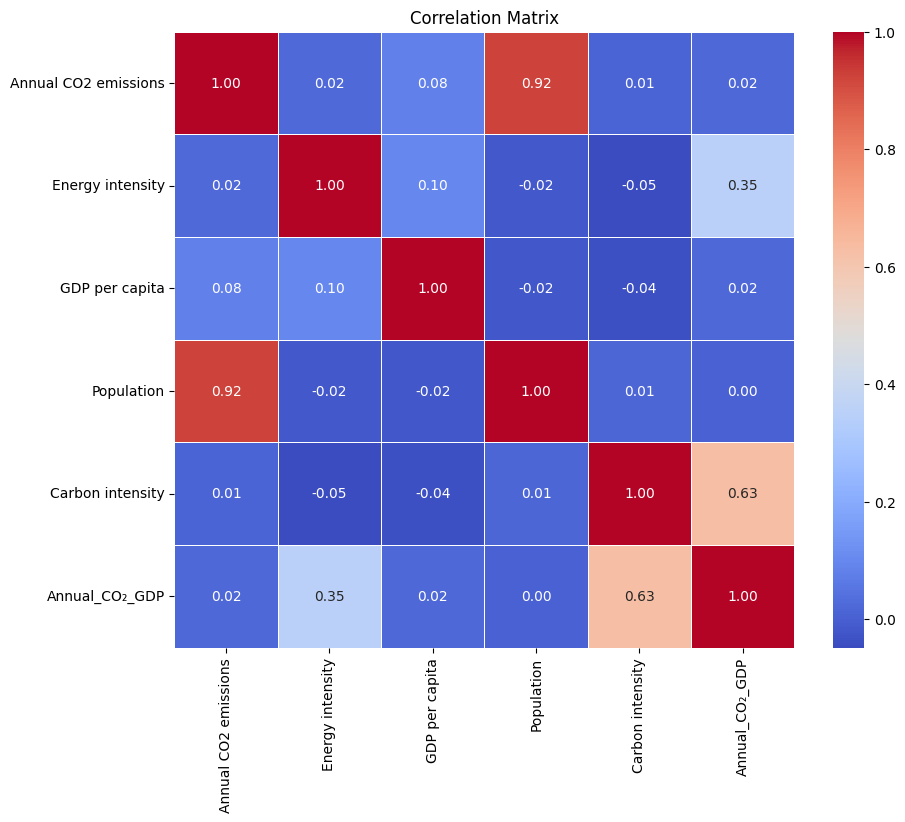

Pearson correlation coefficient: 0.9245270026990813
P-value: 0.0


In [8]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

%load_ext google.colab.data_table

# Load the dataset
df=pd.read_csv('https://raw.githubusercontent.com/Slugten/Final-project-CO2-emissions/main/kaya-identity-co2.csv')
display(df)


# Step 1: Rename columns for clarity
df.rename(columns={
    "Population (historical estimates)": "Population",
    "Annual CO₂ emissions per unit energy (kg per kilowatt-hour)": "Carbon intensity",
    "Primary energy consumption per GDP (kWh/$)": "Energy intensity",
    "Annual CO₂ emissions per GDP (kg per international-$)": "Annual_CO₂_GDP",
    'Annual CO₂ emissions': 'Annual CO2 emissions'
}, inplace=True)

# Step 2: Drop irrelevant columns
df.drop("900793-annotations", axis=1, inplace=True)

# Step 3: Handle missing data
# Identify rows with missing 'Code'
df_missing_code = df[df['Code'].isna()]
print(df_missing_code)

# Drop rows with any missing data
df.dropna(inplace=True)

# Display the cleaned dataset
print(df.head())
print(df.describe())
print(df.isnull().sum())

# Step 4: Exploratory Data Analysis
# Correlation matrix heatmap
correlation_matrix = df.drop(['Entity', 'Code', 'Year'], axis=1).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

# Step 5: Pearson correlation coefficient between Population and Annual CO2 emissions
correlation_coefficient, p_value = pearsonr(df['Population'], df['Annual CO2 emissions'])
print('Pearson correlation coefficient:', correlation_coefficient)
print('P-value:', p_value)


asfasd

In [9]:
# Load the CSV file into a pandas DataFrame
co2_data = pd.read_csv('https://raw.githubusercontent.com/Slugten/Final-project-CO2-emissions/main/owid-co2-data.csv')

# Filter data for the specified years and select key columns
years = [2000, 2022]  # We'll use 1990 and 2022 for comparison
filtered_data = co2_data[co2_data['year'].isin(years)][['country', 'year', 'population', 'co2']]

# Pivot the data to have years as columns
pivot_data = filtered_data.pivot(index='country', columns='year', values=['population', 'co2'])

# Calculate relative changes
pivot_data['population_change'] = (pivot_data['population'][2022] / pivot_data['population'][2000]) * 100
pivot_data['co2_change'] = (pivot_data['co2'][2022] / pivot_data['co2'][2000]) * 100

# Filter out countries with extreme population growth or shrinkage and small countries
pivot_data = pivot_data[(pivot_data['population_change'] <= 300) &
                        (pivot_data['population_change'] >= 70) &
                        (pivot_data['population'][2000] >= 1000000)]

# Calculate the ratio of CO2 change to population change
pivot_data['ratio'] = pivot_data['co2_change'] / pivot_data['population_change']

# Sort by ratio and select top 10 countries with the lowest ratio (biggest decrease in CO2 relative to population)
top_10 = pivot_data.sort_values('ratio').head(10)

# Create a DataFrame for plotting
df_plot = pd.DataFrame({
    'Country': top_10.index,
    'CO2 Change (%)': top_10['co2_change'],
    'Population Change (%)': top_10['population_change'],
    'Ratio': top_10['ratio']
})

# Set up the plot
fig, ax = plt.subplots(figsize=(14, 10))

# Set the width of each bar and positions of the bars
width = 0.35
x = np.arange(len(df_plot))

# Create the bars
rects1 = ax.bar(x - width/2, df_plot['CO2 Change (%)'], width, label='CO2 Change', color='blue', alpha=0.7)
rects2 = ax.bar(x + width/2, df_plot['Population Change (%)'], width, label='Population Change', color='green', alpha=0.7)

# Customize the plot
ax.set_ylabel('Relative Change (%)')
ax.set_title('Top 10 Countries: Relative Change in CO2 Emissions and Population (2000-2022)\nSorted by CO2 Change / Population Change Ratio')
ax.set_xticks(x)
ax.set_xticklabels(df_plot['Country'], rotation=45, ha='right')
ax.legend()

# Add value labels on top of each bar
def autolabel(rects, values):
    for rect, value in zip(rects, values):
        height = rect.get_height()
        ax.annotate(f'{value:.2f}%',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', rotation=90)

autolabel(rects1, df_plot['CO2 Change (%)'])
autolabel(rects2, df_plot['Population Change (%)'])

# Adjust layout and save the plot
plt.tight_layout()
plt.savefig('top_10_co2_vs_population_change.png')
plt.close()

print("Visualization of top 10 countries with biggest CO2 decrease relative to population change has been created and saved as 'top_10_co2_vs_population_change.png'.\n")

print("Top 10 countries with the biggest CO2 decrease relative to population change:\n")
print(df_plot.to_string(index=False))

# Return the dataframe for further analysis if needed
df_plot

Visualization of top 10 countries with biggest CO2 decrease relative to population change has been created and saved as 'top_10_co2_vs_population_change.png'.

Top 10 countries with the biggest CO2 decrease relative to population change:

       Country  CO2 Change (%)  Population Change (%)    Ratio
         Syria       51.014380             135.673931 0.376007
         Yemen       72.216216             180.885434 0.399237
        Angola      100.468897             217.084607 0.462810
     Venezuela       53.832744             115.858893 0.464641
      Zimbabwe       64.090317             137.904366 0.464745
       Denmark       53.508756             110.141009 0.485820
United Kingdom       55.999114             114.713484 0.488165
         Gabon       93.113577             187.675391 0.496142
       Jamaica       62.904790             108.237453 0.581174
        Sweden       69.271800             118.918939 0.582513


,Country,CO2 Change (%),Population Change (%),Ratio
country,,,,
Syria,Syria,51.014380,135.673931,0.376007
Yemen,Yemen,72.216216,180.885434,0.399237
Angola,Angola,100.468897,217.084607,0.462810
Venezuela,Venezuela,53.832744,115.858893,0.464641
Zimbabwe,Zimbabwe,64.090317,137.904366,0.464745
Denmark,Denmark,53.508756,110.141009,0.485820
United Kingdom,United Kingdom,55.999114,114.713484,0.488165
Gabon,Gabon,93.113577,187.675391,0.496142
Jamaica,Jamaica,62.904790,108.237453,0.581174


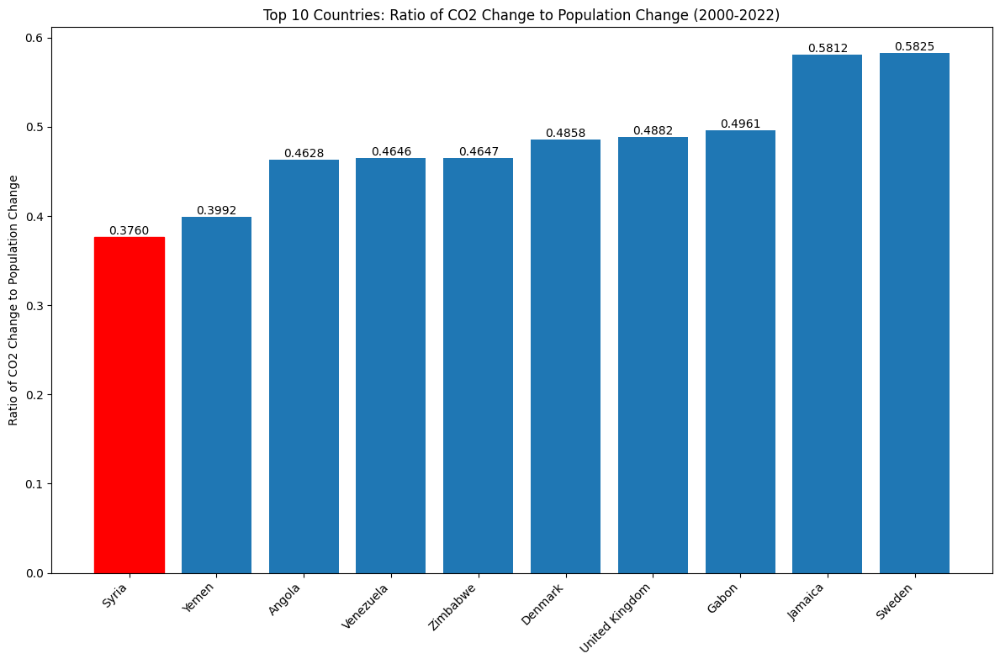

In [10]:
# Sort the dataframe by the ratio
df_plot_sorted = df_plot.sort_values('Ratio')

# Create the bar plot
fig, ax = plt.subplots(figsize=(12, 8))

# Create bars
bars = ax.bar(df_plot_sorted['Country'], df_plot_sorted['Ratio'])

# Highlight Moldova
bars[0].set_color('red')

# Customize the plot
ax.set_ylabel('Ratio of CO2 Change to Population Change')
ax.set_title('Top 10 Countries: Ratio of CO2 Change to Population Change (2000-2022)')
plt.xticks(rotation=45, ha='right')

# Add value labels on top of each bar
for i, v in enumerate(df_plot_sorted['Ratio']):
    ax.text(i, v, f'{v:.4f}', ha='center', va='bottom')

# Adjust layout and save the plot
plt.tight_layout()
plt.savefig('top_10_co2_population_ratio.png')
plt.show()

# **Vraag 3**

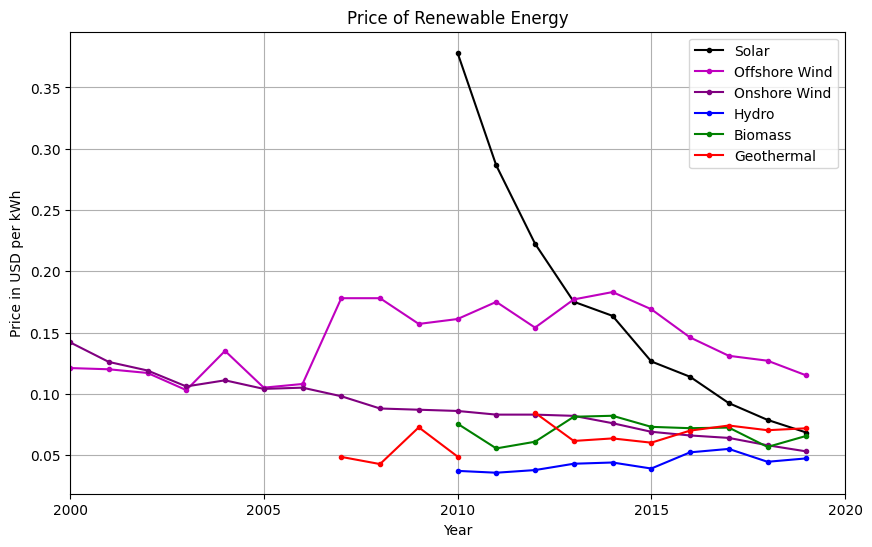

In [11]:
df3 = pd.read_csv('https://github.com/Jack12619/Final_CO2/raw/main/energy.csv')
df4 = pd.read_csv('https://github.com/Jack12619/Final_CO2/raw/main/levelized-cost-of-energy.csv')

# Make a dataframe
world_energy = df4[df4['Entity'] == 'World'].copy()
world_energy.columns =  ['country', 'code', 'year', 'csp', 'hydro', 'solar', 'onshore_wind', 'bio', 'geothermal', 'offshore_wind']
world_energy.drop(columns=['code', 'csp', 'country'], inplace=True)
world_energy = world_energy.sort_values(by='year')

# plotting all
fig,ax = plt.subplots(figsize=(10,6))

temp_data =  world_energy.copy()
all_years = list(range(1983,2036))
temp_x = temp_data['year'].values

temp_y1 = temp_data.solar.values
temp_y2 = temp_data.onshore_wind.values
temp_y3 = temp_data.hydro.values
temp_y4 = temp_data.bio.values
temp_y5 = temp_data.geothermal.values
temp_y6 = temp_data.offshore_wind.values

ax.plot(temp_x, temp_y1, c= 'k', marker='.', label='Solar')
ax.plot(temp_x, temp_y6, c= 'm', marker='.', label='Offshore Wind')
ax.plot(temp_x, temp_y2, c= 'purple', marker='.', label='Onshore Wind')
ax.plot(temp_x, temp_y3, c= 'b', marker='.', label='Hydro')
ax.plot(temp_x, temp_y4, c= 'g', marker='.', label='Biomass')
ax.plot(temp_x, temp_y5, c= 'r', marker='.', label='Geothermal')

ax.set_xlim(2000, 2020)
ax.set_xticks([2000, 2005, 2010, 2015, 2020])
ax.set_xlabel('Year')
ax.set_ylabel('Price in USD per kWh')
ax.set_title('Price of Renewable Energy')
plt.grid()
ax.legend()


plt.show()

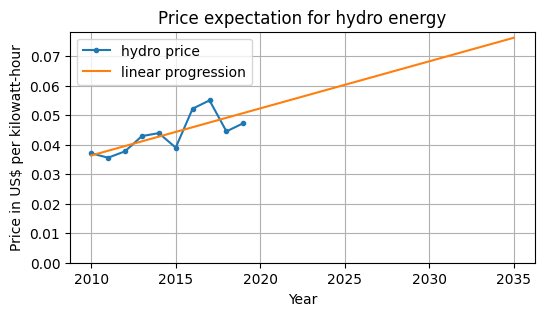

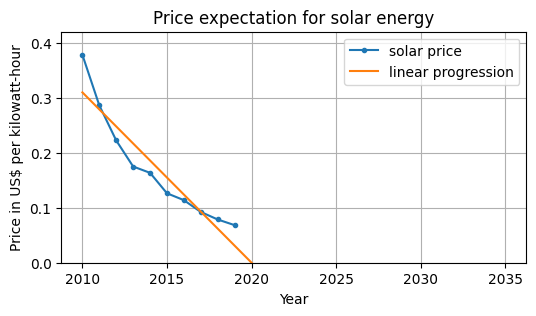

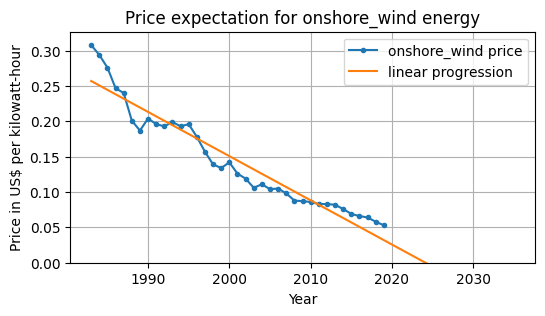

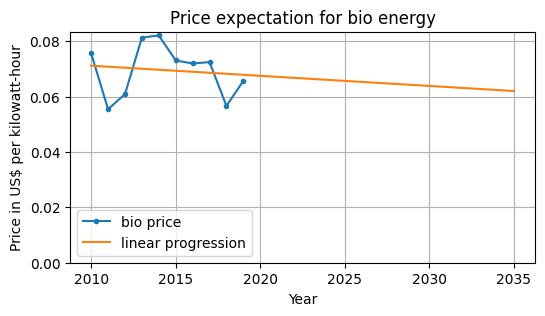

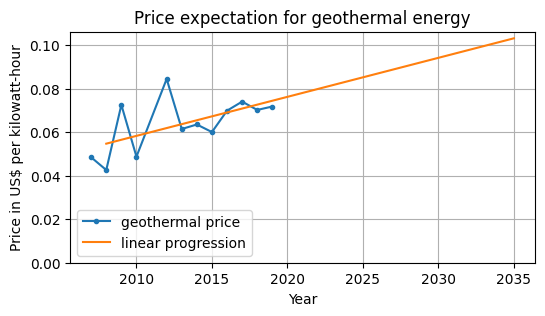

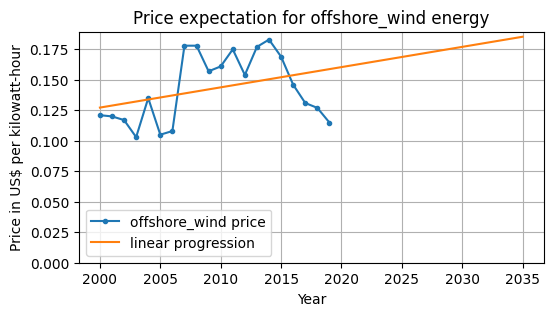

In [12]:
# ipv voor elk type energy een plot te maken, maak ik een functie waar enkel de kolomnaam als input hoeft.
def plot_regression(kolom):
  temp_data =  world_energy[['year', f'{kolom}']].copy()
  temp_data.dropna(how='any', inplace=True)
  temp_x = temp_data['year'].values
  temp_y = temp_data[f'{kolom}'].values

  len_years = 2020 - len(temp_x)
  all_years = list(range(len_years,2036)) # make a list of years

  fig,ax = plt.subplots(figsize= (6, 3))
  ax.plot(temp_x, temp_y, marker='.', label=f'{kolom}'' price')  # plotten

  try:            # add linear progression line
    coefs = np.polynomial.polynomial.polyfit(temp_x, temp_y, 1) # Use np.polynomial.polynomial for polyfit
    ffit = np.polynomial.polynomial.polyval(all_years, coefs) # Use np.polynomial.polynomial for polyval
    ax.plot(all_years, ffit, label='linear progression')
  except ValueError as error:
    print(f"Could not plot linear regression line because:{error}")


  ax.set_xlabel('Year')
  ax.set_ylabel('Price in US$ per kilowatt-hour')
  ax.set_title('Price expectation for ' f'{kolom}' ' energy')
  ax.grid()
  ax.legend()
  ax.set_ylim(0)

  plt.show()

plot_regression('hydro')
plot_regression('solar')
plot_regression('onshore_wind')
plot_regression('bio')
plot_regression('geothermal')
plot_regression('offshore_wind')